## IMAGE COMPRESSION USING K MEANS CLUSTERING. 

In [1]:
# The purpose of this project is to compress image by reducing the total colors to be in range 0 to 30, instead of 0 to 255
# So we find the best clusters first, and then use only those colors in image instead of complete image. 

# Afterwards we will encrypt the image with such that the key is the color coding needed to decode the image. 

In [3]:
# ALL THE IMPORTS
from sklearn.cluster import KMeans, SpectralClustering
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.spatial.distance import cdist 
import seaborn as sns
from matplotlib.image import imread
import os
import plotly

# GLOBAL FUNCTIONS

In [4]:
def get_file_size(file_path):
    """
    Get the size of a file.

    Parameters:
    file_path (str): The path to the file.

    Returns:
    int: The size of the file in bytes.
    """
    # Check if the file exists
    if os.path.exists(file_path):
        # Get the size of the file in bytes
        file_size = os.path.getsize(file_path)
        return file_size
    else:
        print("File not found.")
        return None

    
def show_rgb_components(image):
    """
    Split the image into its RGB components and show them separately.

    Parameters:
    image (numpy.ndarray): The input image.

    Returns:
    None
    """
    # Split the image into red, green, and blue channels
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    # Plot the RGB components
    plt.figure(figsize=(12, 3))

    # Plot red channel
    plt.subplot(1, 4, 1)
    plt.imshow(red_channel, cmap='Reds')
    plt.title('Red Channel')
    plt.axis('off')

    # Plot green channel
    plt.subplot(1, 4, 2)
    plt.imshow(green_channel, cmap='Greens')
    plt.title('Green Channel')
    plt.axis('off')

    # Plot blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(blue_channel, cmap='Blues')
    plt.title('Blue Channel')
    plt.axis('off')

    # Plot complete image
    plt.subplot(1, 4, 4)
    plt.imshow(image)
    plt.title('Complete Image')
    plt.axis('off')

    plt.show()


# CUSTOM LOGIC

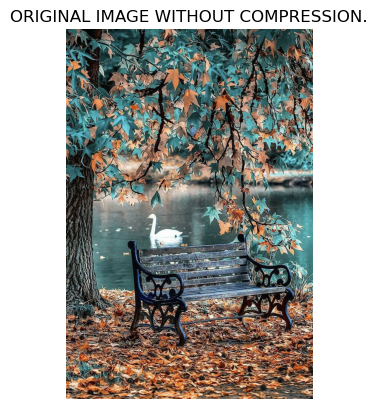

In [5]:
# Read the image
img = imread('/Users/jainilpatel/Downloads/a3f3211768b43934c367489af7675c80.jpg')

# SHOW THE REAL IMAGE TO PEOPLE. 

plt.imshow(img)
plt.title("ORIGINAL IMAGE WITHOUT COMPRESSION.")
plt.axis('off')  # Turn off axis
plt.show()

Size of the original file: 318996 bytes


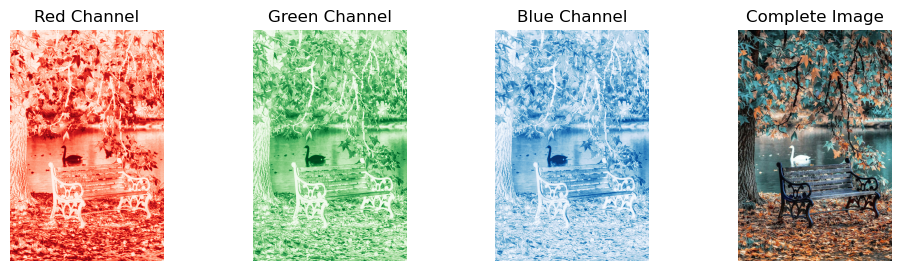

In [6]:
file_path = '/Users/jainilpatel/Downloads/a3f3211768b43934c367489af7675c80.jpg'
size_in_bytes = get_file_size(file_path)
if size_in_bytes is not None:
    print(f"Size of the original file: {size_in_bytes} bytes")

show_rgb_components(img)

image size is  (1105, 736, 3)
AFTER RESHAPING, WE HAVE TOTAL 1 DIMENSIONAL ARRAY OF  813280  And we will be storing all those values into the k means clustering algorithm, hoping to find the centroids. 


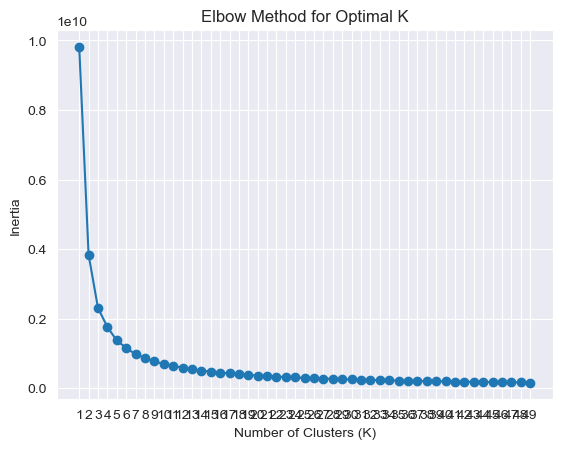

In [6]:
# Save the image size, we don't want to change the image's size at all. 
img_size = img.shape
print("image size is ", img_size)
# Reshape it to be 2-dimension
X = img.reshape(img_size[0] * img_size[1], img_size[2])
print("AFTER RESHAPING, WE HAVE TOTAL 1 DIMENSIONAL ARRAY OF ", len(X), " And we will be storing all those values into the k means clustering algorithm, hoping to find the centroids. ")

# Define a range of cluster numbers to try
k_values = range(1, 50)

inertia_values = []

# Run KMeans for each value of k
for k in k_values:
    km = KMeans(n_clusters=k, random_state=42, n_init="auto")
    km.fit(X)
    inertia_values.append(km.inertia_)

# Plot the elbow method graph
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.show()

THE SHAPE OF 2 dimensional image change to 1 Dimensional image is  (813280, 3)


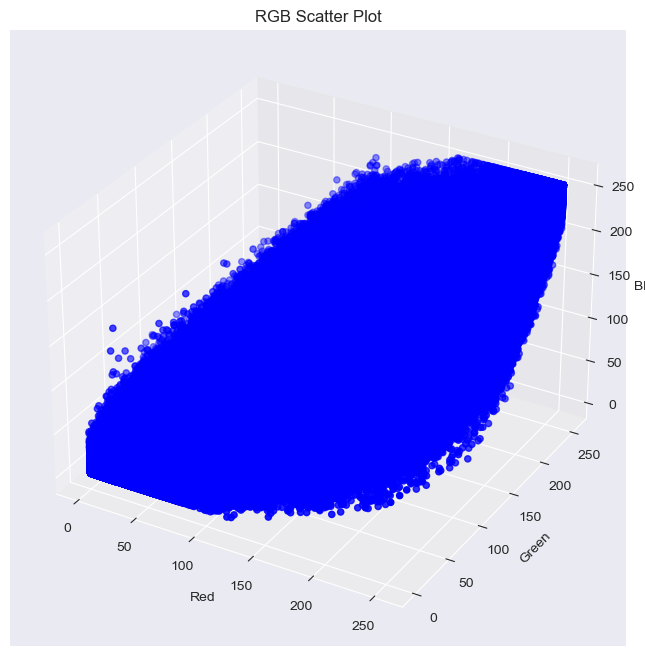

In [7]:
X = img.reshape(img_size[0] * img_size[1], img_size[2])
print("THE SHAPE OF 2 dimensional image change to 1 Dimensional image is ", X.shape)


# Plot the RGB values in a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Extract RGB components
red_values = X[:, 0]
green_values = X[:, 1]
blue_values = X[:, 2]

# Plot the points
ax.scatter(red_values, green_values, blue_values, c='b', marker='o')

# Set labels and title
ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')  # Set z-axis label here
ax.set_title('RGB Scatter Plot')

plt.show()

In [8]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

# Assuming img, img_size, and X are defined before this point

# Extract RGB components
red_values = X[:, 0]
green_values = X[:, 1]
blue_values = X[:, 2]

# Create 3D scatter plot using plotly express
fig = px.scatter_3d(x=red_values, y=green_values, z=blue_values, 
                    labels={'x': 'Red', 'y': 'Green', 'z': 'Blue'},
                    title='RGB Scatter Plot')

# Show plot
fig.write_html("rgb_scatter_plot.html")

fig.show()


In [9]:
# Run the Kmeans algorithm
km = KMeans(n_clusters=8)
km.fit(X)


print("THE LABELS WERE ", km.labels_)
print("THE CLUSTER CENTERES WERE ", km.cluster_centers_)


# Use the centroids to compress the image
X_compressed = km.cluster_centers_[km.labels_]
print(X_compressed.shape)

print("We generated the compressed image from the cluster centers. Cluster center were the colors, index of labels were locations of the colors in 1D, which we will convert to 2D using reshaping.")


/Users/jainilpatel/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



THE LABELS WERE  [6 6 6 ... 2 2 2]
THE CLUSTER CENTERES WERE  [[ 83.28707854 109.58225808 110.26799937]
 [222.20230412 219.78401835 208.13559409]
 [ 23.03494043  17.26686545  14.76953676]
 [166.30420979 121.315705    94.17667678]
 [205.43468252 170.38848266 145.11205899]
 [120.21186494 156.94424717 158.86061268]
 [ 47.63076112  66.66261299  66.27945639]
 [110.31270475  69.03000793  47.41562327]]
(813280, 3)
We generated the compressed image from the cluster centers. Cluster center were the colors, index of labels were locations of the colors in 1D, which we will convert to 2D using reshaping.


In [10]:
import plotly.express as px

# Extract RGB components
red_values = X[:, 0]
green_values = X[:, 1]
blue_values = X[:, 2]

# Create 3D scatter plot using plotly express
fig = px.scatter_3d(x=red_values, y=green_values, z=blue_values,
                    color=km.labels_,
                    color_continuous_scale=px.colors.qualitative.Light24,
                    labels={'x': 'Red', 'y': 'Green', 'z': 'Blue'},
                    title='RGB Scatter Plot with Cluster Labels')

# Show plot
fig.write_html("color_coded_scatter.html")
fig.show()


In [11]:
import pickle

# Save labels and centroids to a file
with open('kmeans_data.pkl', 'wb') as f:
    pickle.dump(km.labels_, f)
    pickle.dump(km.cluster_centers_, f)


Size of the compressed file: 326424 bytes


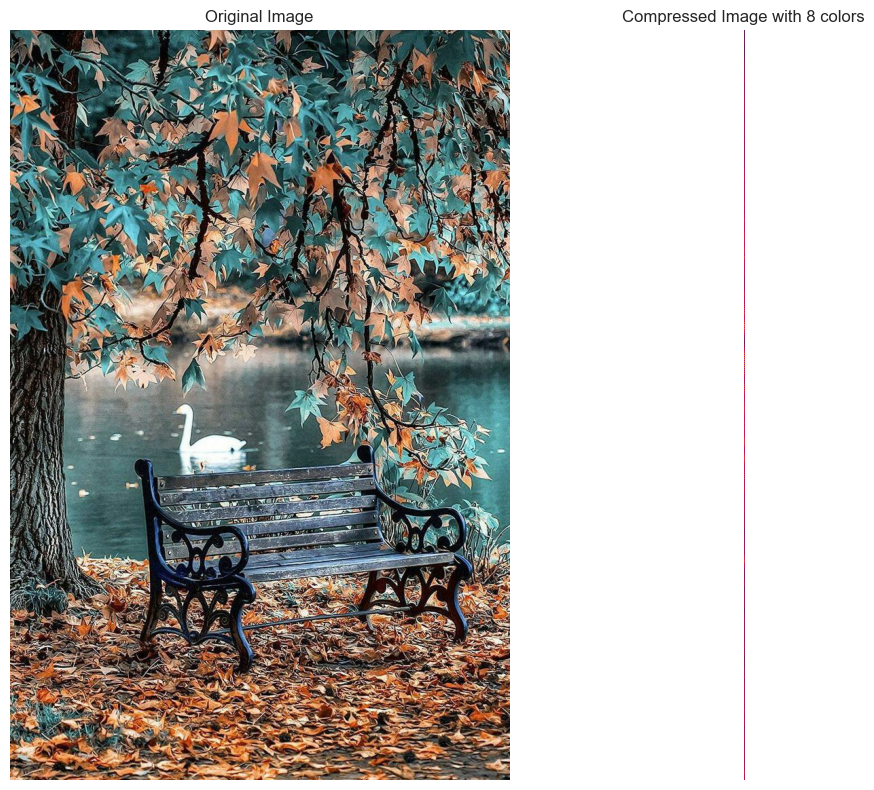

In [12]:
# CHANGE TO INTEGER AND CLIP THOSE SO THEY CANNOT BE 257 by accident
X_compressed = np.clip(X_compressed.astype('uint8'), 0, 255)

compressed_image = X_compressed.reshape(img_size[0], img_size[1], img_size[2])


# Plot the original and the compressed image next to each other
fig, ax = plt.subplots(1, 2, figsize = (12, 8))
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[1].imshow(X_compressed)
ax[1].set_title('Compressed Image with 8 colors')
for ax in fig.axes:
    ax.axis('off')
plt.tight_layout();

from matplotlib.pyplot import imsave

# Assuming `img` is your image array
imsave('saved_compress_image.jpg', img)
file_path = 'saved_compress_image.jpg'
size_in_bytes = get_file_size(file_path)
if size_in_bytes is not None:
    print(f"Size of the compressed file: {size_in_bytes} bytes")

In [13]:
# Thus we reduced the number of colors from 255*255*255 range to just 8. Still we are getting a clear image. We stored the image as encoded image and the colormap is stored separately in the pickle file. 

# USE HIRARCHICAL CLUSTERING

In [ ]:
import numpy as np
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

# Assuming img, img_size, and X are defined before this point

# Reshape the image data to a 2D array
X_flat = img.reshape(-1, 3)

# Run hierarchical clustering
hc = AgglomerativeClustering(n_clusters=8, linkage='ward')
hc.fit(X_flat)

# Get cluster labels
labels = hc.labels_

# Use the mean of each cluster as the compressed color
colors = np.array([X_flat[labels == i].mean(axis=0) for i in range(8)])

# Map each pixel to its compressed color
X_compressed = colors[labels]

# Reshape the compressed image to the original dimensions
X_compressed = X_compressed.reshape(img_size)

# Display the compressed image
plt.imshow(X_compressed)
plt.axis('off')
plt.title('Compressed Image using Hierarchical Clustering')
plt.show()


In [ ]:
# future work:
# Try to do the same with the videos instead of the images. Videos are sequence of images. 